<a href="https://colab.research.google.com/github/elhamod/BA865-2024/blob/main/hands-on/Math_of_Deep_Learning_solutiuon.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Matrix operations**

**Creating tensors and adding them**

In [1]:
import numpy as np

A = np.array([[1,2],[3,4]])
B = np.array([[1,3],[3,5]])

In [2]:
B

array([[1, 3],
       [3, 5]])

In [3]:
B.shape

(2, 2)

In [4]:
A

array([[1, 2],
       [3, 4]])

In [5]:
A.shape

(2, 2)

In [6]:
A+B

array([[2, 5],
       [6, 9]])

We can also "broadcast".

In [7]:
C = np.array([3,5])

In [8]:
A+C

array([[4, 7],
       [6, 9]])

**Matrix Dot Product**

In [9]:
A = np.array([[[1, 2, 3, 4], [3, 4, 1 , 3]],[[1, 2, 3, 4], [3, 4, 1 , 3]]])
B = np.array([[3, 4,1], [1 , 3, 1], [1,2, 1], [3,4, 1]])

In [10]:
A.shape

(2, 2, 4)

In [11]:
B.shape

(4, 3)

In [12]:
C = A@B

In [13]:
C

array([[[20, 32, 10],
        [23, 38, 11]],

       [[20, 32, 10],
        [23, 38, 11]]])

In [14]:
B@A

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2 is different from 3)

A neat way to test tensor operations is to create random tensors with specific dimensionalities.

In [28]:
A = np.random.rand(3,4,5, 5, 6, 3)
B = np.random.rand(3, 2)
(A@B).shape

(3, 4, 5, 5, 6, 2)

**Element-wise Multiplication**

In [29]:
A = np.array([[1,2],[3,4]])
B = np.array([[1,3],[4,5]])

A*B

array([[ 1,  6],
       [12, 20]])

In [30]:
C = np.array([1,3])

A*C

array([[ 1,  6],
       [ 3, 12]])

In [31]:
D = np.array([1,3, 5])

A*D

ValueError: operands could not be broadcast together with shapes (2,2) (3,) 

**Slicing**

In [32]:
A = np.array([[1,2],[3,4]])

A[:, 1]

array([2, 4])

In [15]:
B = np.array([[[1,2, 1],[3,4, 2]], [[1,2, 2],[3,4, 1]]])

B.shape

(2, 2, 3)

In [16]:
B[:, 1, :].shape

(2, 3)

In [17]:
B[:, :, 1].shape

(2, 2)

In [18]:
B[:, :, 0:2].shape

(2, 2, 2)

##What does a linear transformation look like?

Let's draw a line

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Define the start and end points
start_point = np.array([-1, -2])
end_point = np.array([5, 8])

# Number of points (including the start and end points)
num_points = 10

# Create an array of equally spaced points
line = np.linspace(start_point, end_point, num_points)

In [20]:
# Plot a set of points and their transformation
def plot_transformation(points, transformed_points):
  # Plotting
  plt.figure(figsize=(8, 8))
  plt.plot(points[:, 0], points[:, 1], 'b-', label='Original Points')
  plt.plot(transformed_points[:, 0], transformed_points[:, 1], 'r-', label='Transformed Points')

  plt.scatter(points[:, 0], points[:, 1], marker='o', color='b')
  plt.scatter(transformed_points[:, 0], transformed_points[:, 1], marker='o', color='r')

  plt.xlabel('X-axis')
  plt.ylabel('Y-axis')
  plt.title('Transformation of Points')
  plt.legend()
  plt.grid(True)
  plt.axis('equal')
  plt.show()

Transform and plot!

In [21]:
transformed_line = line@np.array([[1,-1],[3,4]])

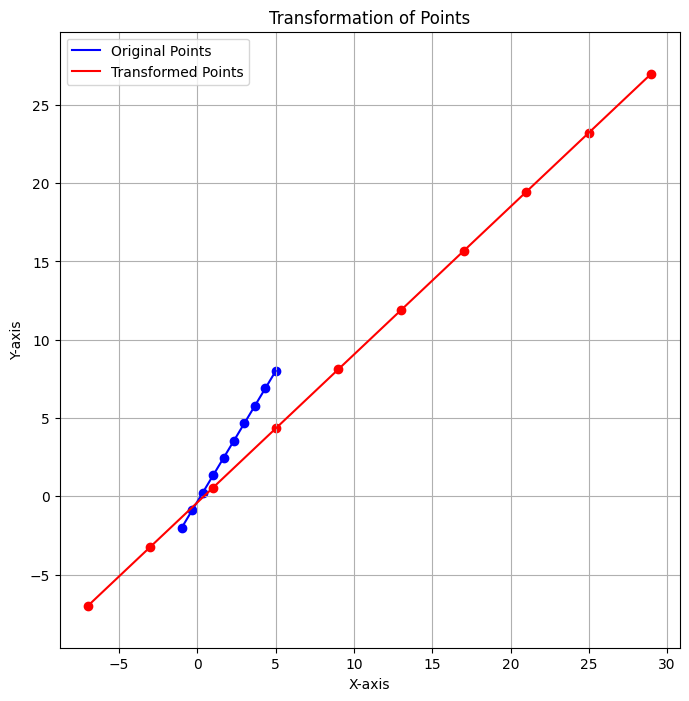

In [22]:
plot_transformation(line, transformed_line)

**How About Non-linearities?**

In [23]:
def nonlinear(x):
    return (1-x)/x

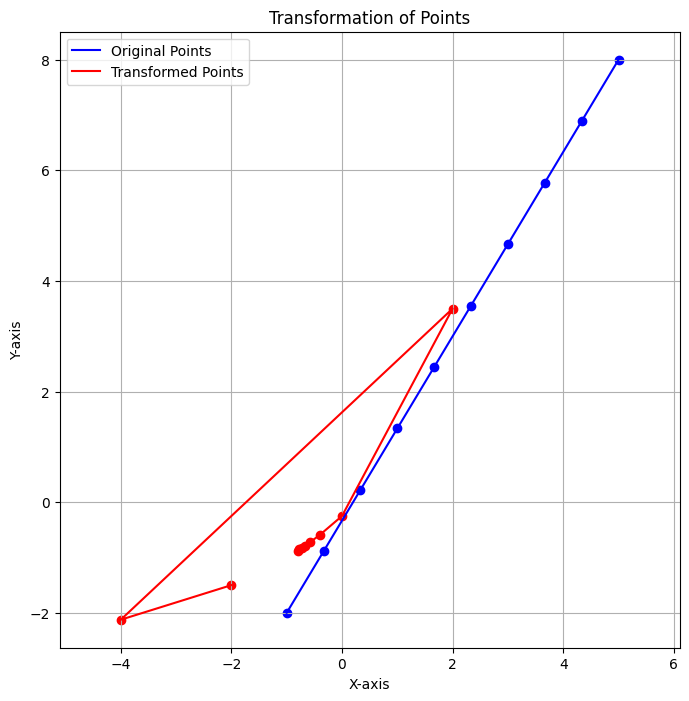

In [24]:
transformed_line_2 = nonlinear(line)
plot_transformation(line, transformed_line_2)

##Gradients


Let's pick a function and explore its gradient

In [45]:
import torch
def func(point):
  x = point[0]
  y = point[1]
  return (torch.sin(x) * torch.sin(y))

# Create a 2D array of equally spaced points
X, Y = np.meshgrid(np.linspace(0, 5, 500), np.linspace(0, 5, 500))
f_xy = func((torch.from_numpy(X), torch.from_numpy(Y)))

Let's do gradient descent with the help of **autodiff** from  *pytorch*.

In [46]:
starting_point = torch.tensor([1.6, 1.6])
alpha = 0.1
num_of_epochs = 60

In [71]:
points = [starting_point]
costs = [func(starting_point)]
for i in range(num_of_epochs):
  last_point = points[-1]

  # create a tensor THAT REQUIRES GRADIENT CALCULATIONS
  last_point = torch.tensor(last_point, requires_grad=True)
  f_xy_torch = func(last_point)

  # Get the gradient at the current point
  f_xy_torch.backward()

  # Update the point
  new_point = last_point - alpha * last_point.grad
  new_cost = func(new_point)

  # Print the current position and function value
  print(f"Iteration {i + 1}: (x, y) = ({new_point[0]:.4f}, {new_point[1]:.4f}), f(x, y) = {new_cost:.4f}")

  last_point = new_point
  points = points + [last_point]
  costs = costs + [new_cost]

Iteration 1: (x, y) = (1.6029, 1.6029), f(x, y) = 0.9990
Iteration 2: (x, y) = (1.6061, 1.6061), f(x, y) = 0.9988
Iteration 3: (x, y) = (1.6097, 1.6097), f(x, y) = 0.9985
Iteration 4: (x, y) = (1.6135, 1.6135), f(x, y) = 0.9982
Iteration 5: (x, y) = (1.6178, 1.6178), f(x, y) = 0.9978
Iteration 6: (x, y) = (1.6225, 1.6225), f(x, y) = 0.9973
Iteration 7: (x, y) = (1.6277, 1.6277), f(x, y) = 0.9968
Iteration 8: (x, y) = (1.6333, 1.6333), f(x, y) = 0.9961
Iteration 9: (x, y) = (1.6396, 1.6396), f(x, y) = 0.9953
Iteration 10: (x, y) = (1.6464, 1.6464), f(x, y) = 0.9943
Iteration 11: (x, y) = (1.6540, 1.6540), f(x, y) = 0.9931
Iteration 12: (x, y) = (1.6623, 1.6623), f(x, y) = 0.9917
Iteration 13: (x, y) = (1.6713, 1.6713), f(x, y) = 0.9899
Iteration 14: (x, y) = (1.6813, 1.6813), f(x, y) = 0.9878
Iteration 15: (x, y) = (1.6923, 1.6923), f(x, y) = 0.9853
Iteration 16: (x, y) = (1.7043, 1.7043), f(x, y) = 0.9823
Iteration 17: (x, y) = (1.7175, 1.7175), f(x, y) = 0.9786
Iteration 18: (x, y) = 

<ipython-input-71-737e8e495eda>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  last_point = torch.tensor(last_point, requires_grad=True)


In [72]:
import pandas as pd

points = torch.stack(points)
costs = torch.tensor(costs)
trajectory = torch.cat((points, costs.view(-1,1)), axis= 1).detach().numpy()
trajectory = pd.DataFrame(trajectory, columns=['x', 'y', 'z'])

Let's plot

In [73]:
import plotly.graph_objects as go

def plot_gradient_descent(points):
  # Create a surface plot using Plotly
  fig = go.Figure(data=[go.Surface(z=f_xy, x=X, y=Y)])

  # Update layout and axis labels
  fig.update_layout(title='Surface Plot',
                    scene=dict(xaxis_title='X',
                              yaxis_title='Y',
                              zaxis_title='f(X, Y)'))

  # Add a scatter plot (set of points) to the figure
  fig.add_trace(go.Scatter3d(x=trajectory['x'], y=trajectory['y'], z=trajectory['z'],
                            mode='markers', marker=dict(size=5, color='red')))


  # Show the plot
  fig.show()

In [74]:
plot_gradient_descent(points.detach().numpy())

**MSE and MAE**

In [75]:
import torch
import torch.nn.functional as F


# Define two sample vectors
y_true = torch.tensor([1.0, 2.0, 3.0, 4.0, 5.0])
y_pred = torch.tensor([1.5, 2.5, 2.8, 3.9, 5.1])

# Calculate Mean Absolute Error (MAE) using built-in function
mae = F.l1_loss(y_true, y_pred)
print(f"MAE: {mae}")

# Calculate Mean Squared Error (MSE) using built-in function
mse = F.mse_loss(y_true, y_pred)
print(f"MSE: {mse}")

MAE: 0.2799999713897705
MSE: 0.1120000034570694


In [90]:
# Create sliders for each logit
x1_slider = widgets.FloatSlider(value=0.0, min=-10.0, max=10.0, step=0.1, description='x1:')
x2_slider = widgets.FloatSlider(value=0.0, min=-10.0, max=10.0, step=0.1, description='x2:')
def calculate_loss(x1, x2):
    print(f"MAE: {F.l1_loss(torch.tensor(x1), torch.tensor(x2))}")
    print(f"MSE: {F.mse_loss(torch.tensor(x1), torch.tensor(x2))}")

In [91]:
# Display the sliders and the result
ui = widgets.VBox([x1_slider, x2_slider])
out = widgets.interactive_output(calculate_loss, {'x1': x1_slider, 'x2': x2_slider})
display(ui, out)

Output()

**Softmax and Cross Entropy**

In [93]:
import torch.nn as nn
import torch
import torch.nn.functional as F

# Define the logits and ground truth labels
logits = torch.tensor([[2.0, 1.0, 0.1], [0.1, 3.0, 0.2]])
ground_truth = torch.tensor([0, 1])

# Define the cross-entropy loss function
CE = nn.CrossEntropyLoss()

# Calculate the loss
loss = CE(logits, ground_truth)

print("Cross-entropy loss:", loss.item())

Cross-entropy loss: 0.26331570744514465


Other ways

In [94]:
# Calculate log loss (negative log likelihood)
# Note: F.nll_loss expects log probabilities, so we use log_softmax
log_probabilities = F.log_softmax(logits, dim=1)
loss = F.nll_loss(log_probabilities, ground_truth)

print("Cross-entropy loss:", loss.item())

Cross-entropy loss: 0.26331570744514465


In [95]:
probabilities = F.softmax(logits, dim=1)

# Compute log loss manually using the softmax probabilities
log_probabilities = torch.log(probabilities)
loss = F.nll_loss(log_probabilities, ground_truth)

print("Cross-entropy loss:", loss.item())

Cross-entropy loss: 0.26331570744514465


Let's play with this a bit

In [96]:
import numpy as np
# from sklearn.metrics import log_loss
import ipywidgets as widgets
from IPython.display import display

ground_truth = torch.tensor([2])  # Assuming the true class is the third one

# Define a function to calculate and display the cross-entropy loss
def calculate_loss(logit1, logit2, logit3):
    logits = torch.tensor([[logit1, logit2, logit3]])

    # Calculate cross-entropy loss
    loss = CE(logits, ground_truth)

    # calculate probabilities
    probabilities = F.softmax(logits, dim=1)

    print(f"Logits: {logits}")
    print(f"Probabilities: {probabilities}")
    print(f"Ground Truth: {ground_truth}")
    print(f"Cross-entropy loss: {loss}")

In [97]:
# Create sliders for each logit
logit1_slider = widgets.FloatSlider(value=0.0, min=-10.0, max=10.0, step=0.1, description='Logit 1:')
logit2_slider = widgets.FloatSlider(value=0.0, min=-10.0, max=10.0, step=0.1, description='Logit 2:')
logit3_slider = widgets.FloatSlider(value=0.0, min=-10.0, max=10.0, step=0.1, description='Logit 3:')

In [98]:
# Display the sliders and the result
ui = widgets.VBox([logit1_slider, logit2_slider, logit3_slider])
out = widgets.interactive_output(calculate_loss, {'logit1': logit1_slider, 'logit2': logit2_slider, 'logit3': logit3_slider})
display(ui, out)

Output()